# World Data League 2023

## 🎯 Challenge
*Determining The Main Mobility Flows in the City of Lisbon Based on Mobile Device Data*


## Team: Team Solo
## 👥 Authors
* Olufemi Victor
* Okewunmi Paul 
* Fajemila Oluwadunsin

## 💻 Development

In [1]:
!pip install -qq geopandas holidays contextily

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import MinuteLocator, DateFormatter
import numpy as np
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Polygon
import contextily as ctx
import pytz
import gc, os
import warnings

warnings.filterwarnings("ignore")
%matplotlib inline

In [4]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
#!cp "/content/drive/MyDrive/machine_learning_stories/WDL/ficheiros_WDL" -r "/content"

## 🖼️ Visualisations

In [5]:
data = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")

# Convert Datetime column to datetime object
data['Datetime'] = pd.to_datetime(data['Datetime'])

Here, we analyze the mobile phone data to explore the relationship between the number of entries and departures from Lisbon for all the axis of entry during rush hours.

From the plot, we discovered that certain times peaked for all the roads, and this happened simultaneously, for both Entries and Departures. This was observed at 8AM and 5PM respectively

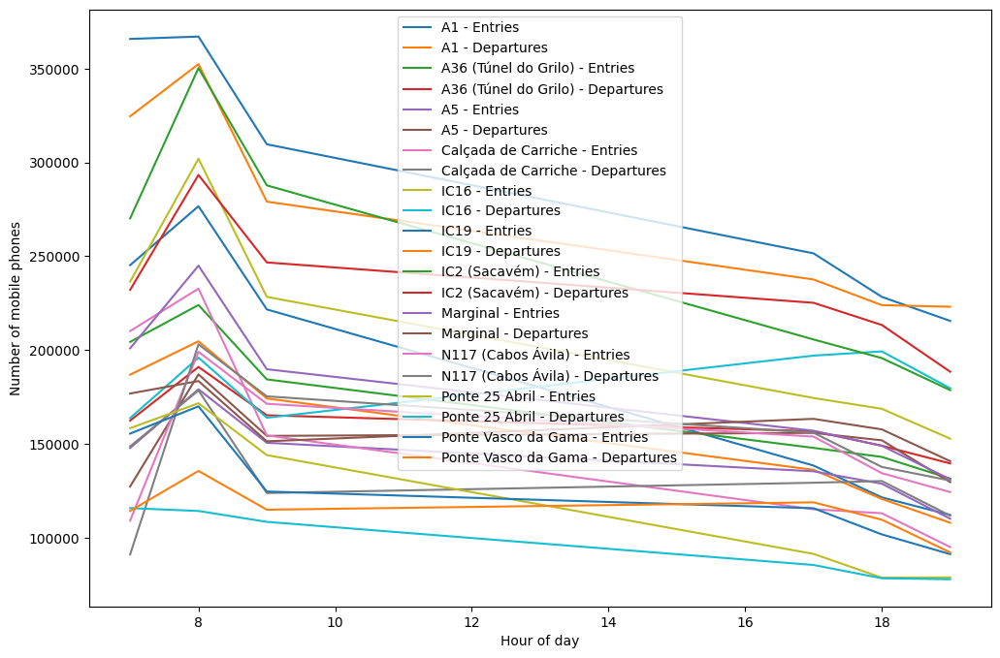

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Read in the dataset
df = data.copy()

# Convert Datetime column to datetime format
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Extract hour from Datetime column
df['Hour'] = df['Datetime'].dt.hour

# Aggregate by hour and axis
df_agg = df.groupby(['Eixo', 'Hour']).agg({'C12': 'sum', 'C13': 'sum'}).reset_index()

# Filter for rush hours (e.g. 7am-10am and 5pm-8pm)
df_rush = df_agg[df_agg['Hour'].isin([7, 8, 9, 17, 18, 19])]

# Create a larger figure
fig = plt.figure(figsize=(12, 8))

# Plot line chart of entries and departures for each axis over time
for axis in df_rush['Eixo'].unique():
    df_axis = df_rush[df_rush['Eixo'] == axis]
    plt.plot(df_axis['Hour'], df_axis['C12'], label=f'{axis} - Entries')
    plt.plot(df_axis['Hour'], df_axis['C13'], label=f'{axis} - Departures')

plt.legend()
plt.xlabel('Hour of day')
plt.ylabel('Number of mobile phones')
plt.show()


Next, we aggregate the total number of mobile phones that entered Lisbon for each axis of entry.

Of all the roads, we discovered that the road IC19 had the highest traffic. We recorded massive inflow and outflow. This proves that the **IC19 is the busiest road** among the explored main roads in Lisbon

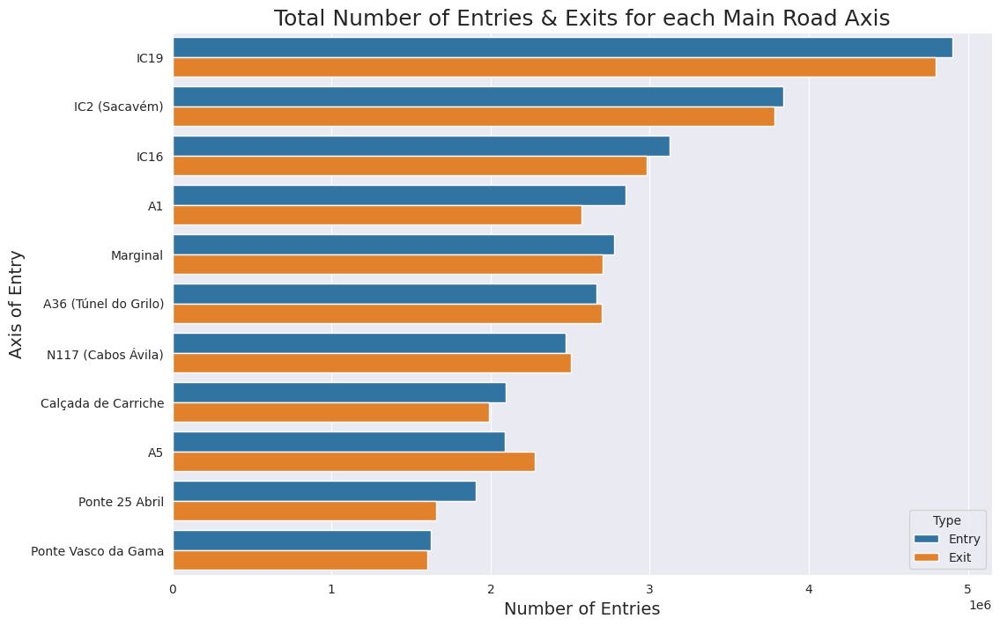

In [7]:
df = data.groupby('Eixo').agg({'C12': 'sum', 'C13': 'sum'}).reset_index()
df = df.sort_values(by='C12', ascending=False)
sns.set_style('darkgrid')
plt.figure(figsize=(12, 8))
#ax = sns.barplot(x=['C12','c13'], y='Eixo', data=df)

# melt the DataFrame to create a long-form dataset for seaborn
df_melt = df.melt(id_vars=['Eixo'], var_name='Type', value_name='Value')

# Replace the values in the 'Type' column
df_melt['Type'] = df_melt['Type'].replace({'C12': 'Entry', 'C13': 'Exit'})

# plot the bar chart using seaborn's barplot function
ax = sns.barplot(y='Eixo', x='Value', hue='Type', data=df_melt)


ax.set_xlabel('Number of Entries', fontsize=14)
ax.set_ylabel('Axis of Entry', fontsize=14)
ax.set_title('Total Number of Entries & Exits for each Main Road Axis', fontsize=18)
plt.show()

Here, we perform some data manipulation to create a heatmap of total entries by hour of the day and day of the week. 

* IC19, IC2 (Sacavem) and IC12 in that respective order are the most trafficked area by 8:00AM. 

* And even though the N117 road is the 7th busiest road among the 11, it is actually on of the least trafficked road by 7:00AM, but a drastic change in traffic occurs between 7AM and 8AM.

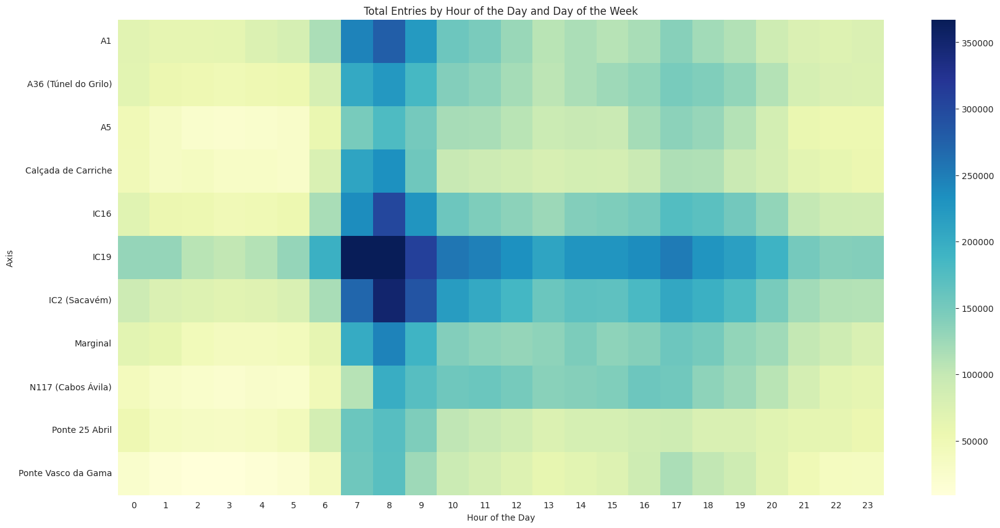

In [8]:
df = data.copy()

# Convert Datetime column to datetime format
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Add a new column for hour of the day
df['Hour'] = df['Datetime'].dt.hour

# Bin the x-axis by hour of the day
df['Hour'] = pd.cut(df['Hour'], bins=24, labels=False)

# Create a pivot table with total entries by hour of the day and day of the week
table = pd.pivot_table(df, values='C12', index=['Eixo'], columns=['Hour'], aggfunc=sum)

# Plot the heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(table, cmap='YlGnBu')
plt.title('Total Entries by Hour of the Day and Day of the Week')
plt.xlabel('Hour of the Day')
plt.ylabel('Axis')
plt.show()

Create a Line plot showing the number of entries and exits for each week

A futher proof that the departure and entries are strongly correlated, we see that the weekly chart for both the entries are in sync, and strongly correlated.

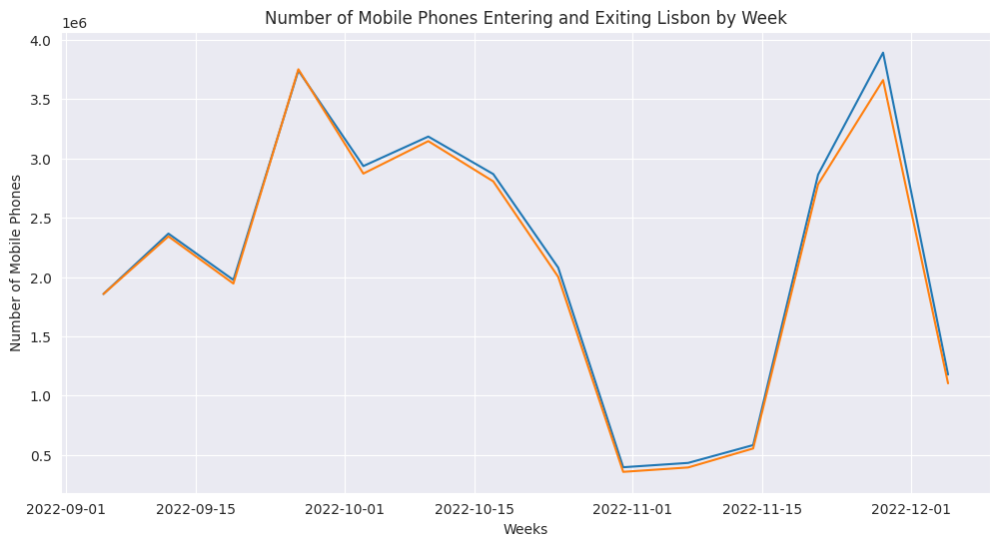

In [9]:
df = data.copy()
# Group the data by week
df_week = df.groupby(pd.Grouper(key='Datetime', freq='W-MON')).sum().reset_index()

# Plot line graph
plt.figure(figsize=(12,6))
sns.lineplot(x='Datetime', y='C12', data=df_week)
sns.lineplot(x='Datetime', y='C13', data=df_week)
plt.xlabel('Weeks')
plt.ylabel('Number of Mobile Phones')
plt.title('Number of Mobile Phones Entering and Exiting Lisbon by Week')
plt.show()

### Grid Data

In [10]:
one = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv")
two = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv")
three = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_GRELHA_indCD15m_2022_09_0001_4000.csv")
data2 = pd.concat([one,two, three])
del one, two, three

In [11]:
df = data2.copy()

# Convert Datetime column to datetime format
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Extract hour from Datetime column
df['Hour'] = df['Datetime'].dt.hour

# Filter for rush hours (e.g. 7am-10am and 5pm-8pm)
df = df[df['Hour'].isin([7, 8, 9, 17, 18, 19])].reset_index(drop=True)

data2 = df.drop("Hour", axis=1)
#data2

,Grid_ID,Datetime,C1,C2,C3,C4,C5,C6,C7,C8
0,1,2022-09-07 18:00:00+00:00,15.720000,0.000000,10.480000,0.00,5.240000,6.840000,0.00,2.45
1,1,2022-09-07 09:15:00+00:00,4.670000,0.000000,4.670000,0.00,0.000000,1.490000,0.00,0.00
2,1,2022-09-07 07:00:00+00:00,5.130000,0.000000,5.130000,0.00,0.000000,0.000000,0.00,0.00
3,1,2022-09-07 08:15:00+00:00,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00
4,1,2022-09-07 18:45:00+00:00,26.820000,0.000000,26.820000,0.00,21.139999,2.520000,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...
834331,393,2022-09-09 17:30:00+00:00,159.270004,17.980000,111.639999,12.45,70.940002,95.930000,5.53,9.36
834332,393,2022-09-09 07:45:00+00:00,182.660004,13.590000,127.419998,6.80,126.309998,130.470001,11.33,13.77
834333,393,2022-09-09 17:45:00+00:00,121.419998,12.950000,98.309998,10.07,59.619999,56.349998,2.88,8.41
834334,393,2022-09-09 19:00:00+00:00,132.339996,19.650000,97.709999,19.65,72.669998,94.430000,7.02,4.49


Here, we try to understand how locals and Visitors in lisbon navigate through the grids.

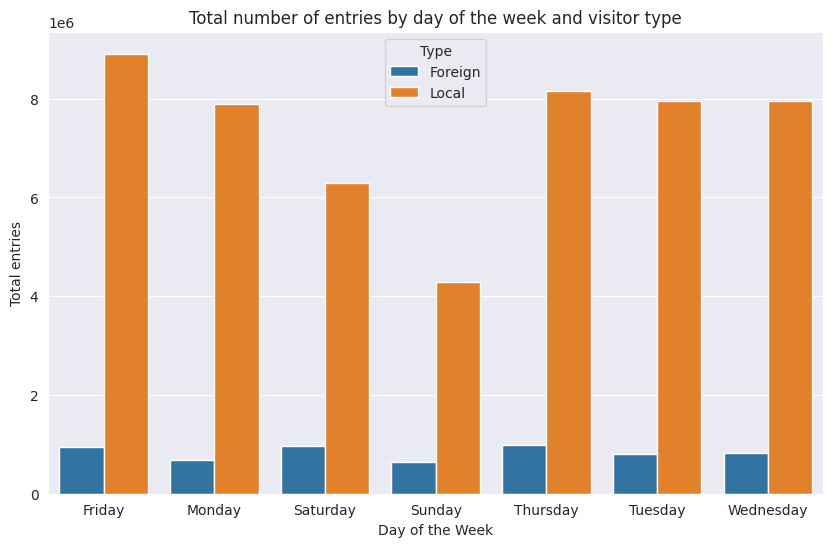

In [12]:
# Create a new column 'Foreign' that indicates whether the entry is from a foreign visitor
df = data2.copy()

# Convert the 'Datetime' column to a datetime object
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Extract the day of the week as a string
df['DayOfWeek'] = df['Datetime'].dt.strftime('%A')

df = df.groupby(['DayOfWeek'])[['C5', 'C7']].sum().reset_index()
df["Foreign"] = df.C7
df["Local"] = df.C5 - df.C7

df = df[["DayOfWeek", "Foreign", "Local"]]

# Create a barplot to compare the total number of entries by day of the week and visitor type
plt.figure(figsize=(10, 6))

# melt the DataFrame to create a long-form dataset for seaborn
df_melt = df.melt(id_vars=['DayOfWeek'], var_name='Type', value_name='Value')

# plot the bar chart using seaborn's barplot function
ax = sns.barplot(x='DayOfWeek', y='Value', hue='Type', data=df_melt)

# set the axis labels and the title
plt.xlabel('Day of the Week')
plt.ylabel('Total entries')
plt.title('Total number of entries by day of the week and visitor type')

# show the plot
plt.show()


Does grid A affect Grid B? We create a scatter plot to compare the relationship between the number of entries and exits in two different grids, Grid 1 and Grid 2.

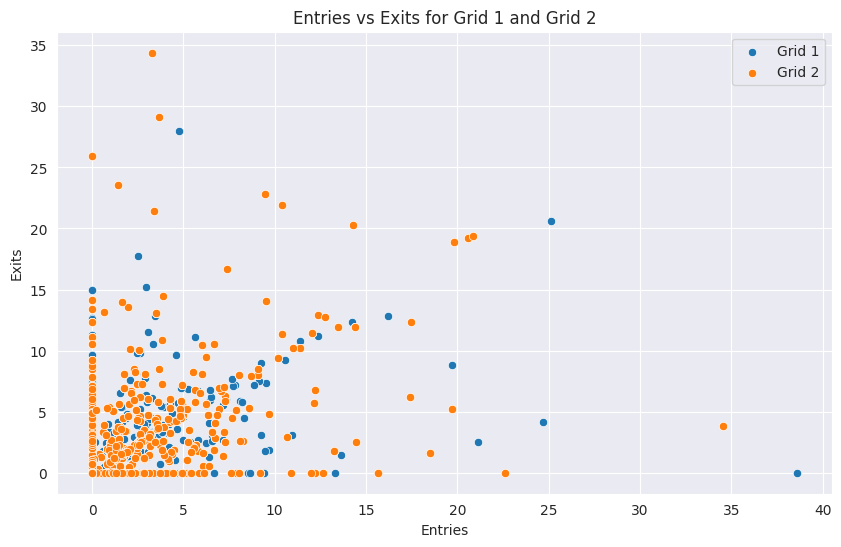

In [13]:
# Read in the data
df = data2.copy()

# Create a new DataFrame with entries for Grid 1 and Grid 2
df_subset = df[df['Grid_ID'].isin([1, 2])]
df_grid1 = df_subset[df_subset['Grid_ID'] == 1]
df_grid2 = df_subset[df_subset['Grid_ID'] == 2]

# Create a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='C5', y='C6', data=df_grid1, label='Grid 1')
sns.scatterplot(x='C5', y='C6', data=df_grid2, label='Grid 2')
plt.xlabel('Entries')
plt.ylabel('Exits')
plt.title('Entries vs Exits for Grid 1 and Grid 2')
plt.legend()
plt.show()

###### Geo data Viz

This section contains Geographical Visualization, specifically hostpots in lisbon.

A GIF of The 11 roads and Hotspots for all the grids .

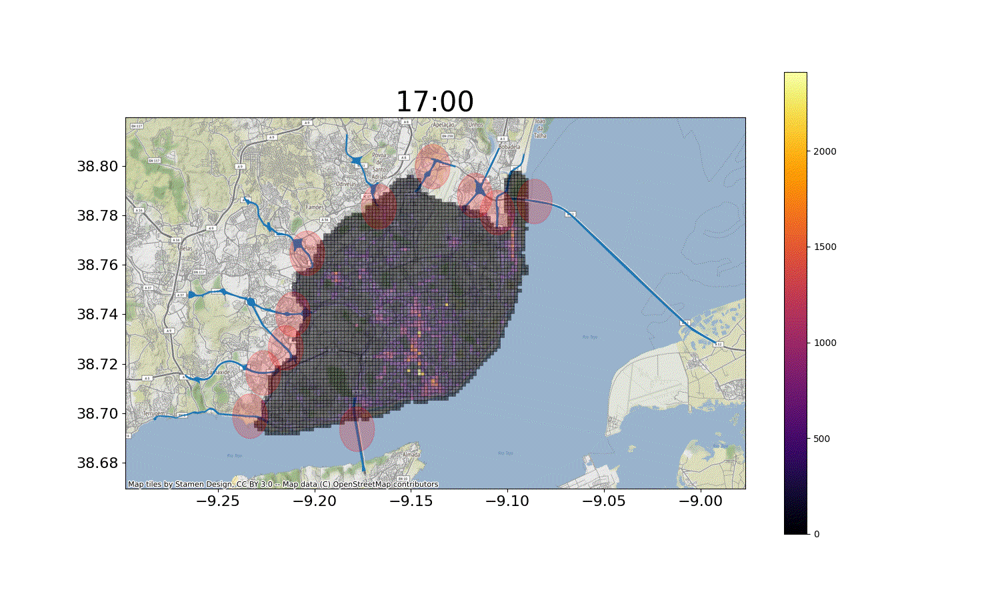

In [14]:
grid_info = pd.read_excel('ficheiros_WDL/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx', sheet_name=["em bruto"])
grid = grid_info.get('em bruto')

In [15]:
def get_polygon(row):
    try:
        position_dict = eval(row['position']) # convert string to dictionary
        if 'geometries' in position_dict:
            geometry_dict = position_dict['geometries'][0]
            if 'coordinates' in geometry_dict:
                coordinates_list = geometry_dict['coordinates'][0]
                polygon = Polygon(coordinates_list)
                return polygon
    except:
        pass
    return None

# Apply the get_polygon function to create a new column 'geometry' with the Polygon objects
grid['geometry'] = grid.apply(get_polygon, axis=1)

# Create a geopandas dataframe from the pandas dataframe
gdf = gpd.GeoDataFrame(grid, geometry='geometry')

gdf = gpd.GeoDataFrame(grid.dropna(subset=['geometry']), geometry='geometry')

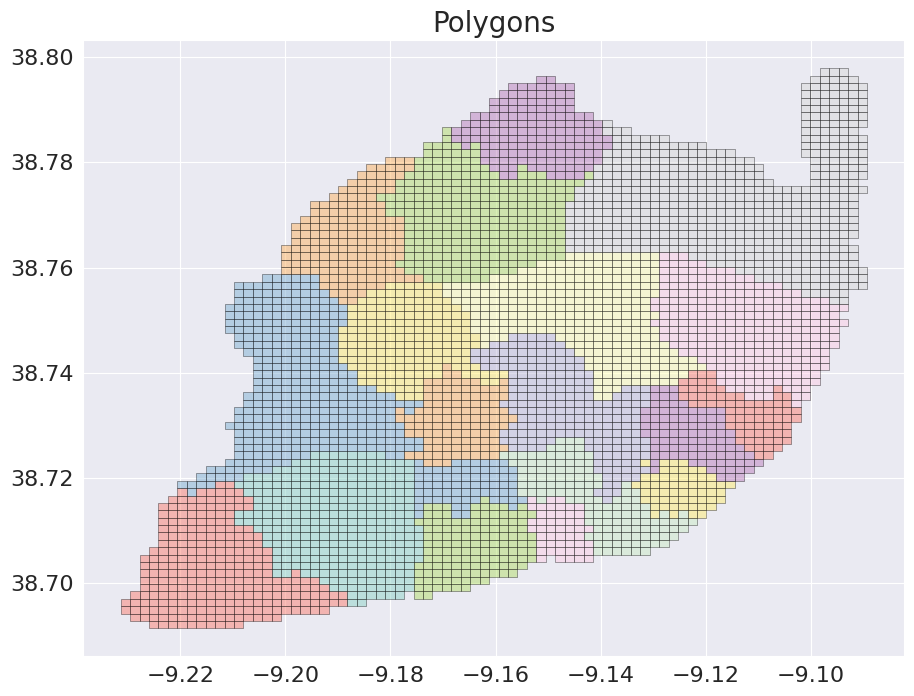

In [16]:
fig, ax = plt.subplots(figsize=(15,8))

# Create a plot with all the polygons colored by a categorical column
gdf.plot(ax=ax, column='freguesia', cmap='Set3', edgecolor='black', linewidth=0.5, alpha=0.5)


# Set the font size and title of the plot
ax.set_title('Polygons', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=16)

# Show the plot
plt.show()

#### Modelling

Here we built AutoRegression models to do two major tasks.

1. The First goal was to forecast the number of people entering and leaving each City for the main roads.

2. The second goal was to forecast the number of people roaming, entering, and leaving the gids in the city.


The model uses historical data to forecast the movement of people between different parts of the city during rush hours, such as 7:00AM-10:00AM (Morning) and 5:00PM-8:00PM (Evening). 

###### Implication

This would provide insights into mobility patterns and trends, helping city planners and transportation officials  to better understand and anticipate the demand for transportation services in different areas of Lisbon.
Comuters are informed about the possible congestion of the area and hence making informed decision on route to pass

In [18]:
entering_main_road_df = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")
grid_lat_and_long = pd.read_excel("ficheiros_WDL/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")

unique_road = entering_main_road_df.Eixo.unique()
lat_and_long = [(38.68917, -9.17694), (38.76722, -9.21028), (38.69306, -9.42167), (38.76083, -9.24028), (38.76556, -9.09722), (38.76056, -9.15694), (38.72972, -9.24167), (38.75333, -9.11806), (38.77528, -9.04806), (38.79444, -9.10722), (38.72222, -9.35444)]
road_lat_and_long = dict(zip(unique_road, lat_and_long))

#### Forecasting Number of people entering and leaving for each of the eleven roads

#### Morning

We did a split of the data for morning and evening which enables us to give a focus to our modelling.

In [19]:
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error
import holidays


model_dict = dict()
score_dict = dict()

for road in unique_road:

  data_road = entering_main_road_df[entering_main_road_df['Eixo']==road].reset_index(drop=True)
  data_road["Datetime"] = pd.to_datetime(data_road["Datetime"])

  data_road.sort_values(by='Datetime').reset_index(drop=True)

  morning_rush = data_road[data_road['Datetime'].dt.weekday.isin([0,1,2,3,4]) & 
        (data_road['Datetime'].dt.hour >= 7) & (data_road['Datetime'].dt.hour < 10)].reset_index(drop=True)
  
  new_data_road = morning_rush[["Datetime", "C12", "C13"]].groupby(pd.Grouper(key='Datetime', freq='15T'), as_index=False).sum()
  new_data_length = new_data_road.shape[0]-2000
  time_series = new_data_road[["C12", "C13"]].loc[0:new_data_length]
  y_series = new_data_road[["C12", "C13"]].loc[new_data_length:]


  model_fit = VAR(time_series).fit(4,trend="n")
  model_dict[road] = model_fit

  n_forecast = 2000


  forecast = model_fit.forecast(time_series.values[-model_fit.k_ar:], steps=n_forecast)
  score_rmsle = mean_squared_log_error(np.abs(y_series), np.abs(forecast))**0.5
  score_rmse = mean_squared_error(y_series, forecast)**0.5

  score_dict[road] = (score_rmsle, score_rmse)

  #print(f"RMSLE and RMSE for {road} is {score_rmsle} and {score_rmse} respectively for the last {n_forecast} observations")
  


###### Result

How good can we forecast the number of people entering and leaving the grid in the morning?

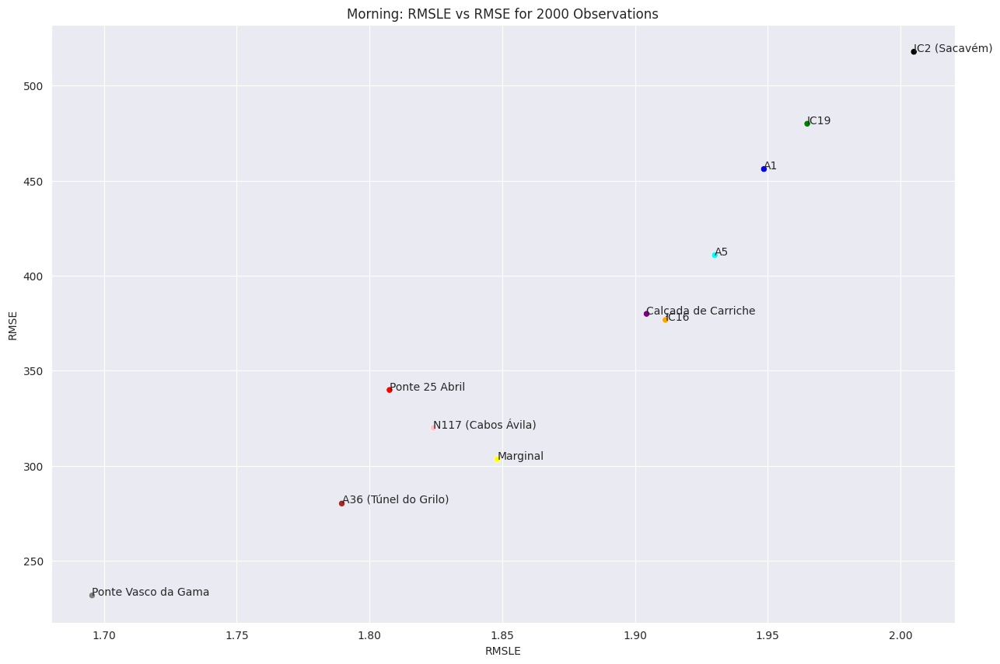

In [20]:


# Create a dictionary of road names and colors
road_colors = {'Ponte 25 Abril': 'red', 'IC16': 'orange', 'Marginal': 'yellow',
               'IC19': 'green', 'A1': 'blue', 'Calçada de Carriche': 'purple',
               'N117 (Cabos Ávila)': 'pink', 'A36 (Túnel do Grilo)': 'brown',
               'Ponte Vasco da Gama': 'gray', 'IC2 (Sacavém)': 'black',
               'A5': 'cyan'}

# Extract RMSLE and RMSE values from the dictionary
rmsle_values = [value[0] for key, value in score_dict.items()]
rmse_values = [value[1] for key, value in score_dict.items()]

# Extract the road names from the dictionary
road_names = [key for key, value in score_dict.items()]

# Create the scatter plot with hue
fig, ax = plt.subplots(figsize =(15,10))
sns.scatterplot(x=rmsle_values, y=rmse_values, hue=road_names, palette=road_colors, legend=False)

# Add annotations for each road name
for i, txt in enumerate(road_names):
    plt.annotate(txt, (rmsle_values[i], rmse_values[i]))

# Set the axis labels and title
plt.xlabel('RMSLE')
plt.ylabel('RMSE')
plt.title('Morning: RMSLE vs RMSE for 2000 Observations')

# Display the plot
plt.show()


#### Evening

In [21]:
import numpy as np
import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_squared_log_error
import holidays


model_dict = dict()
score_dict = dict()

for road in unique_road:

  data_road = entering_main_road_df[entering_main_road_df['Eixo']==road].reset_index(drop=True)
  data_road["Datetime"] = pd.to_datetime(data_road["Datetime"])

  data_road.sort_values(by='Datetime').reset_index(drop=True)

  evening_rush = data_road[data_road['Datetime'].dt.weekday.isin([0,1,2,3,4]) & 
        (data_road['Datetime'].dt.hour >= 17) & (data_road['Datetime'].dt.hour < 20)].reset_index(drop=True)
  
  new_data_road = evening_rush[["Datetime", "C12", "C13"]].groupby(pd.Grouper(key='Datetime', freq='15T'), as_index=False).sum()
  new_data_length = new_data_road.shape[0]-2000
  time_series = new_data_road[["C12", "C13"]].loc[0:new_data_length]
  y_series = new_data_road[["C12", "C13"]].loc[new_data_length:]


  model_fit = VAR(time_series).fit(trend="n")
  model_dict[road] = model_fit

  n_forecast = 2000


  forecast = model_fit.forecast(time_series.values[-model_fit.k_ar:], steps=n_forecast)
  score_rmsle = mean_squared_log_error(np.abs(y_series), np.abs(forecast))**0.5
  score_rmse = mean_squared_error(y_series, forecast)**0.5

  score_dict[road] = (score_rmsle, score_rmse)

  #print(f"RMSLE and RMSE for {road} is {score_rmsle} and {score_rmse} respectively for the last {n_forecast} observations")
  


###### Result

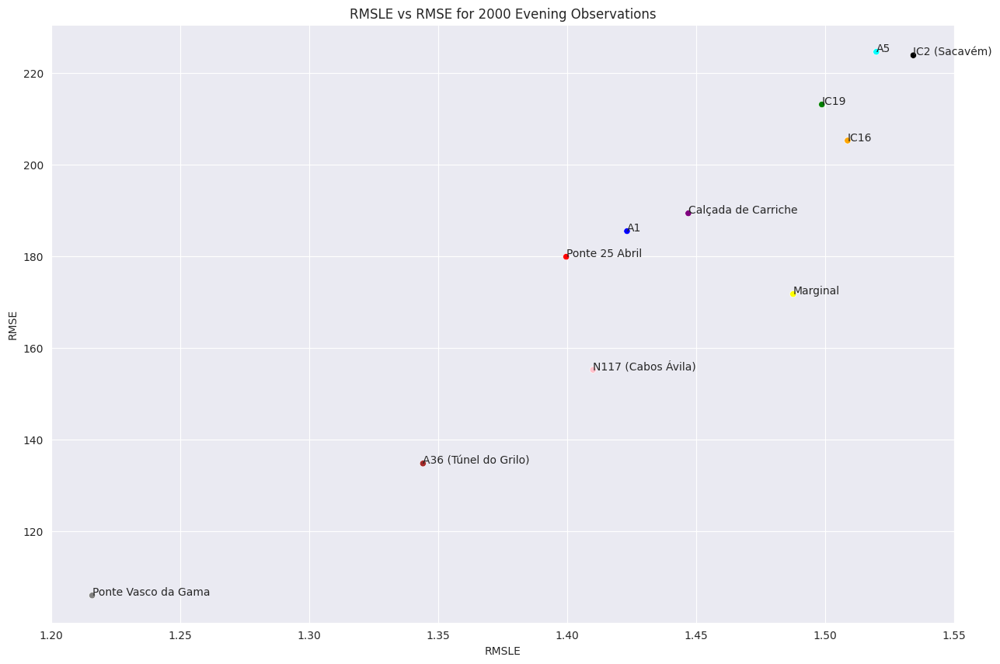

In [22]:

# Create a dictionary of road names and colors
road_colors = {'Ponte 25 Abril': 'red', 'IC16': 'orange', 'Marginal': 'yellow',
               'IC19': 'green', 'A1': 'blue', 'Calçada de Carriche': 'purple',
               'N117 (Cabos Ávila)': 'pink', 'A36 (Túnel do Grilo)': 'brown',
               'Ponte Vasco da Gama': 'gray', 'IC2 (Sacavém)': 'black',
               'A5': 'cyan'}

# Extract RMSLE and RMSE values from the dictionary
rmsle_values = [value[0] for key, value in score_dict.items()]
rmse_values = [value[1] for key, value in score_dict.items()]

# Extract the road names from the dictionary
road_names = [key for key, value in score_dict.items()]

# Create the scatter plot with hue
fig, ax = plt.subplots(figsize =(15,10))
sns.scatterplot(x=rmsle_values, y=rmse_values, hue=road_names, palette=road_colors, legend=False)

# Add annotations for each road name
for i, txt in enumerate(road_names):
    plt.annotate(txt, (rmsle_values[i], rmse_values[i]))

# Set the axis labels and title
plt.xlabel('RMSLE')
plt.ylabel('RMSE')
plt.title('RMSLE vs RMSE for 2000 Evening Observations')

# Display the plot
plt.show()


### Forecasting Number of people entering, leaving, roaming each grid C1 to C8

In [23]:
grid_combined = data2.copy()

# Convert Datetime column to datetime format
grid_combined['Datetime'] = pd.to_datetime(df['Datetime'])

In [24]:
unique_grids = grid_combined.Grid_ID.unique()
grid_combined.sort_values(by='Datetime').reset_index(drop=True)
gc.collect()

7298

#### Morning

In [25]:
grid_score_dict = dict()
for grid in unique_grids:
  data_grid = grid_combined[grid_combined['Grid_ID']==grid].reset_index(drop=True)
  data_grid["Datetime"] = pd.to_datetime(data_grid["Datetime"])

  morning_rush = data_grid[data_grid['Datetime'].dt.weekday.isin([0,1,2,3,4]) & 
        (data_grid['Datetime'].dt.hour >= 7) & (data_grid['Datetime'].dt.hour < 10)].reset_index(drop=True)


  data_length = morning_rush.shape[0]-20

  time_series = morning_rush[["C1", "C2","C3", "C4","C5", "C6","C7", "C8"]].loc[0:data_length]
  y_series = morning_rush[["C1", "C2","C3", "C4","C5", "C6","C7", "C8"]].loc[data_length:]

  model_fit = VAR(time_series).fit(10, trend="n")
  model_dict[road] = model_fit

  n_forecast = 20

  forecast = model_fit.forecast(time_series.values[-model_fit.k_ar:], steps=n_forecast)

  score_rmsle = mean_squared_log_error(np.abs(y_series), np.abs(forecast))**0.5
  score_rmse = mean_squared_error(y_series, forecast)**0.5

  grid_score_dict[grid] = (score_rmsle, score_rmse)

  #print(f"RMSLE and RMSE for {grid} is {score_rmsle} and {score_rmse} respectively for the last {n_forecast} observations")

###### Result

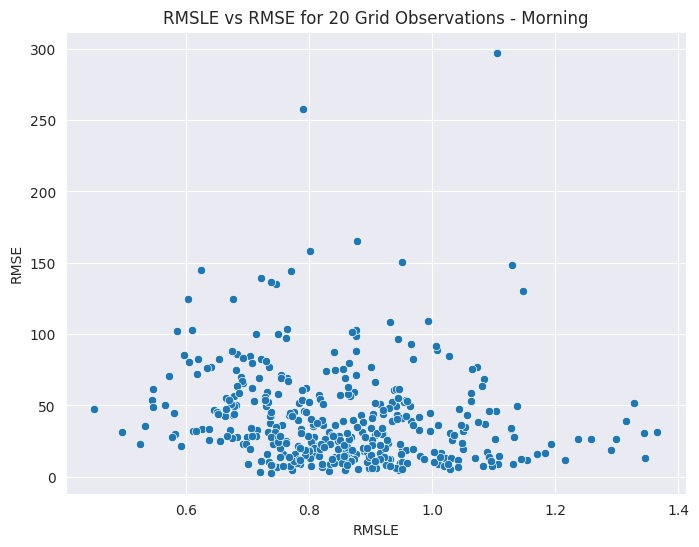

In [26]:
# Extract RMSLE and RMSE values from the dictionary
rmsle_values = [value[0] for key, value in   grid_score_dict.items()]
rmse_values = [value[1] for key, value in   grid_score_dict.items()]

# Extract the road names from the dictionary
road_names = [key for key, value in score_dict.items()]

# Create the scatter plot with hue
fig, ax = plt.subplots(figsize =(8,6))
sns.scatterplot(x=rmsle_values, y=rmse_values)

# Set the axis labels and title
plt.xlabel('RMSLE')
plt.ylabel('RMSE')
plt.title(f'RMSLE vs RMSE for {n_forecast} Grid Observations - Morning')

# Display the plot
plt.show()

In [27]:
evegrid_score_dict = dict()
for grid in unique_grids:
  data_grid = grid_combined[grid_combined['Grid_ID']==grid].reset_index(drop=True)
  data_grid["Datetime"] = pd.to_datetime(data_grid["Datetime"])

  evening_rush = data_grid[data_grid['Datetime'].dt.weekday.isin([0,1,2,3,4]) & 
        (data_grid['Datetime'].dt.hour >= 7) & (data_grid['Datetime'].dt.hour < 10)].reset_index(drop=True)


  data_length = evening_rush.shape[0]-20

  time_series = evening_rush[["C1", "C2","C3", "C4","C5", "C6","C7", "C8"]].loc[0:data_length]
  y_series = evening_rush[["C1", "C2","C3", "C4","C5", "C6","C7", "C8"]].loc[data_length:]

  model_fit = VAR(time_series).fit(10, trend="n")
  model_dict[road] = model_fit

  n_forecast = 20

  forecast = model_fit.forecast(time_series.values[-model_fit.k_ar:], steps=n_forecast)

  score_rmsle = mean_squared_log_error(np.abs(y_series), np.abs(forecast))**0.5
  score_rmse = mean_squared_error(y_series, forecast)**0.5

  evegrid_score_dict[grid] = (score_rmsle, score_rmse)

  #print(f"RMSLE and RMSE for {grid} is {score_rmsle} and {score_rmse} respectively for the last {n_forecast} observations")

###### Result

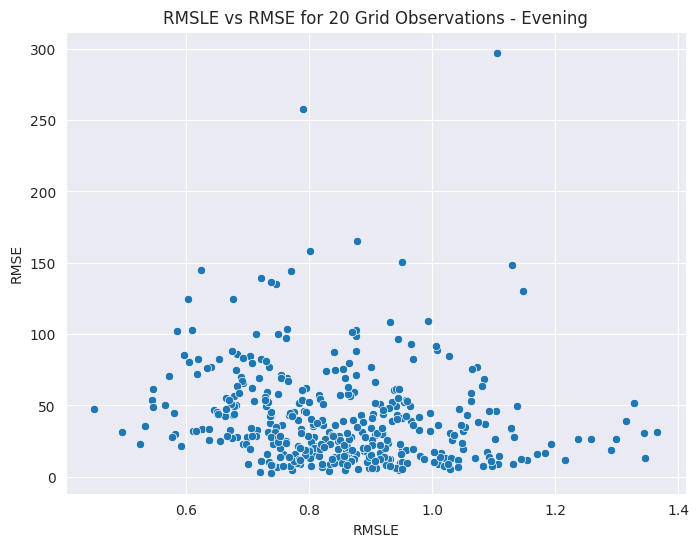

In [28]:
# Extract RMSLE and RMSE values from the dictionary
rmsle_values = [value[0] for key, value in   evegrid_score_dict.items()]
rmse_values = [value[1] for key, value in   evegrid_score_dict.items()]

# Extract the road names from the dictionary
road_names = [key for key, value in score_dict.items()]

# Create the scatter plot with hue
fig, ax = plt.subplots(figsize =(8,6))
sns.scatterplot(x=rmsle_values, y=rmse_values)

# Set the axis labels and title
plt.xlabel('RMSLE')
plt.ylabel('RMSE')
plt.title(f'RMSLE vs RMSE for {n_forecast} Grid Observations - Evening')

# Display the plot
plt.show()

#### Determining Free Grid to move into

In [29]:
grid_lat_and_long = pd.read_excel("ficheiros_WDL/DISPOSITIVOS MOVEIS_QUADRICULAS/DISPOSITIVOS MOVEIS_QUADRICULAS.xlsx")

unique_road = entering_main_road_df.Eixo.unique()
lat_and_long = [(38.68917, -9.17694), (38.76722, -9.21028), (38.69306, -9.42167), (38.76083, -9.24028), (38.76556, -9.09722), (38.76056, -9.15694), (38.72972, -9.24167), (38.75333, -9.11806), (38.77528, -9.04806), (38.79444, -9.10722), (38.72222, -9.35444)]
road_lat_and_long = dict(zip(unique_road, lat_and_long))

In [30]:
# Define a function to calculate the distance between two points given their latitude and longitude
def haversine_distance(lat1, lon1, lat2, lon2):
  # Convert degrees to radians
  lat1 = np.radians(lat1)
  lon1 = np.radians(lon1)
  lat2 = np.radians(lat2)
  lon2 = np.radians(lon2)

  # Calculate the difference between latitudes and longitudes
  dlat = lat2 - lat1
  dlon = lon2 - lon1

  # Apply the haversine formula
  a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
  c = 2 * np.arcsin(np.sqrt(a))
  r = 6371 # Earth radius in kilometers
  d = c * r # Distance in kilometers
  return d

# Define a function to return the top n closest grid to the road
def closest_grid(df, road_dict, road_name, n):
  # Get the latitude and longitude of the road from the dictionary
  road_lat, road_lon = road_dict[road_name]

  # Calculate the distance from each grid to the road using the haversine_distance function
  df['distance'] = df.apply(lambda row: haversine_distance(row['latitude'], row['longitude'], road_lat, road_lon), axis=1)

  # Sort the dataframe by distance in ascending order
  df = df.sort_values(by='distance')

  # Return the top n rows of the dataframe as a list of tuples
  return list(df[['grelha_id', 'latitude', 'longitude']].head(n).itertuples(index=False, name=None))

In [31]:
closest_grid(grid_lat_and_long, road_lat_and_long, "Ponte 25 Abril", n=4)

[(103, 38.6977030795, -9.17831486242),
 (104, 38.6977030795, -9.17472160129),
 (102, 38.6977030795, -9.18011149299),
 (105, 38.6977030795, -9.17292497072)]

## 👓 References
List all of the external links (even if they are already linked above), such as external datasets, papers, blog posts, code repositories and any other materials.

1. https://en.wikipedia.org/wiki/Lisbon
2. https://lisbonlisboaportugal.com/lisbon-transport/Driving-in-Lisbon.html

## ⏭️ Appendix


1. We create a scatter plot of the number of entries into Lisbon versus the number of departures from Lisbon for each axis of entry.

From the plot, we discovered that the Entry and Exit traffic are strongly correlated, meaning that people were actually entering and exiting Lisbon. There are however certain instances where we have massive number of people entering and exiting lisbon, but the netflow remains somewhat stable

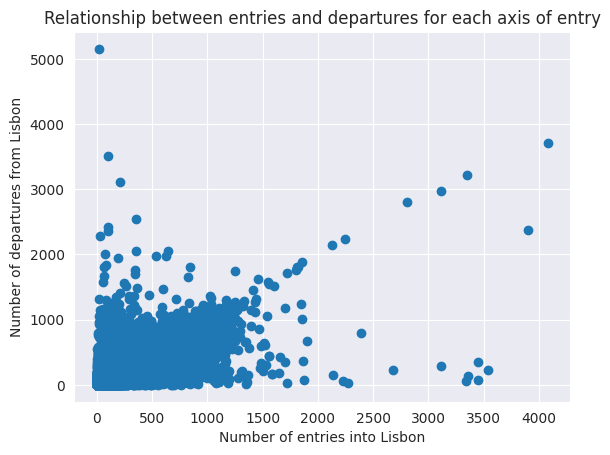

In [32]:
data = pd.read_csv("ficheiros_WDL/DISPOSITIVOS MOVEIS_GRELHA E EIXOS/CML_DISPOSITIVOS MOVEIS_EIXOS_all.csv")
# Convert Datetime column to datetime object
data['Datetime'] = pd.to_datetime(data['Datetime'])

# Create scatter plot
plt.scatter(data['C12'], data['C13'])

# Add axis labels and title
plt.xlabel('Number of entries into Lisbon')
plt.ylabel('Number of departures from Lisbon')
plt.title('Relationship between entries and departures for each axis of entry')

# Show plot
plt.show()

2. Streamline our line plot to show the daily basis. There's a drastic drop in traffic on thursdays which is unconventional. Sunday also has very low traffic since it is not a working day.

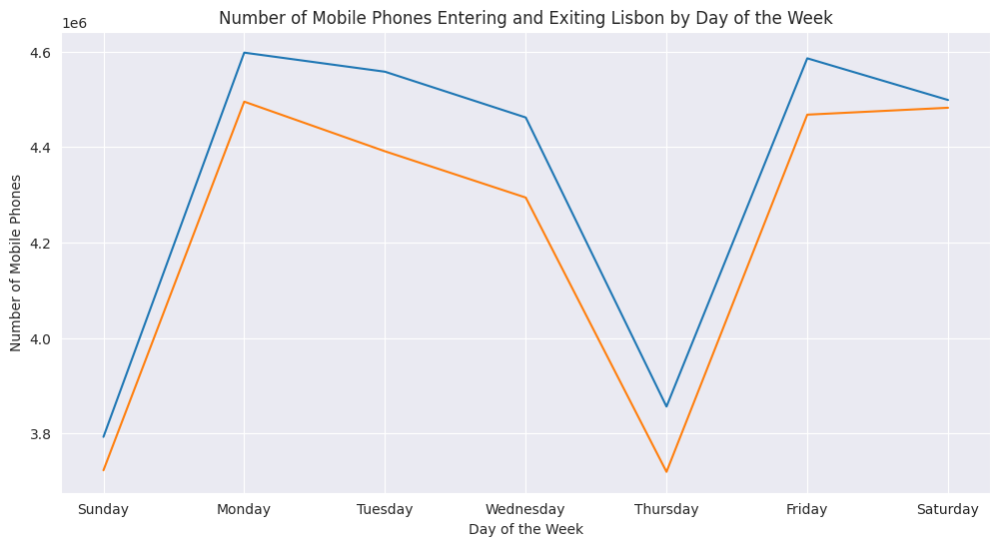

In [33]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read in the dataset
df = data.copy()

# Convert Datetime column to datetime format
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Group the data by day of the week and sort by day order
weekday_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
df_week = df.groupby(df['Datetime'].dt.day_name()).sum().loc[weekday_order].reset_index()

# Reorder the rows of the DataFrame so that Sunday comes first
sunday_idx = df_week[df_week['Datetime'] == 'Sunday'].index[0]
df_week = pd.concat([df_week[sunday_idx:], df_week[:sunday_idx]])

# Plot line graph
plt.figure(figsize=(12,6))
sns.lineplot(x='Datetime', y='C12', data=df_week)
sns.lineplot(x='Datetime', y='C13', data=df_week)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Mobile Phones')
plt.title('Number of Mobile Phones Entering and Exiting Lisbon by Day of the Week')
plt.xticks(range(7), weekday_order)
plt.show()


A GIF of The 11 roads and Hotspots for all the grids .

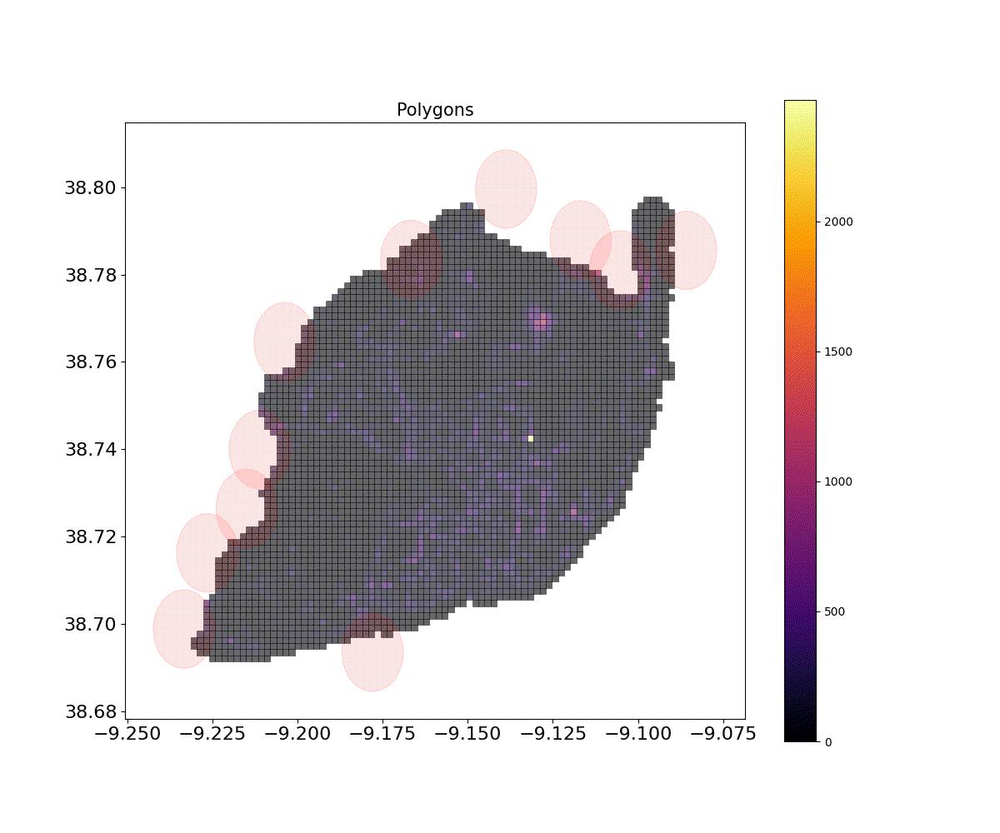

A Map View of The main roads in Lisbon

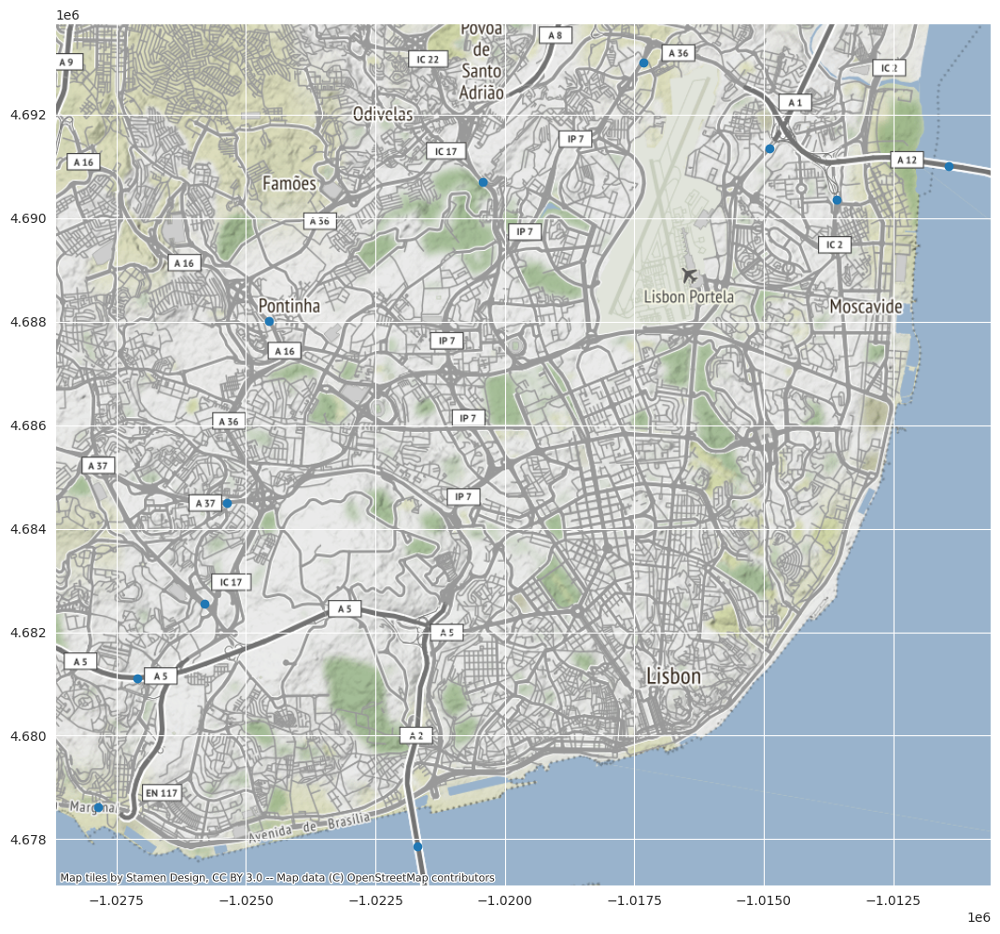

In [17]:
shp = gpd.read_file('ficheiros_WDL/DISPOSITIVOS MOVEIS_TROАOS DE VIA/DISPOSITIVOS MOVEIS_TROАOS VIA_PONTOS/Entradas_Lx.shp')

fig, ax = plt.subplots(figsize =(20,12))
shp.plot(ax=ax)
ctx.add_basemap(ax=ax, crs=shp.crs.to_string())
plt.show()

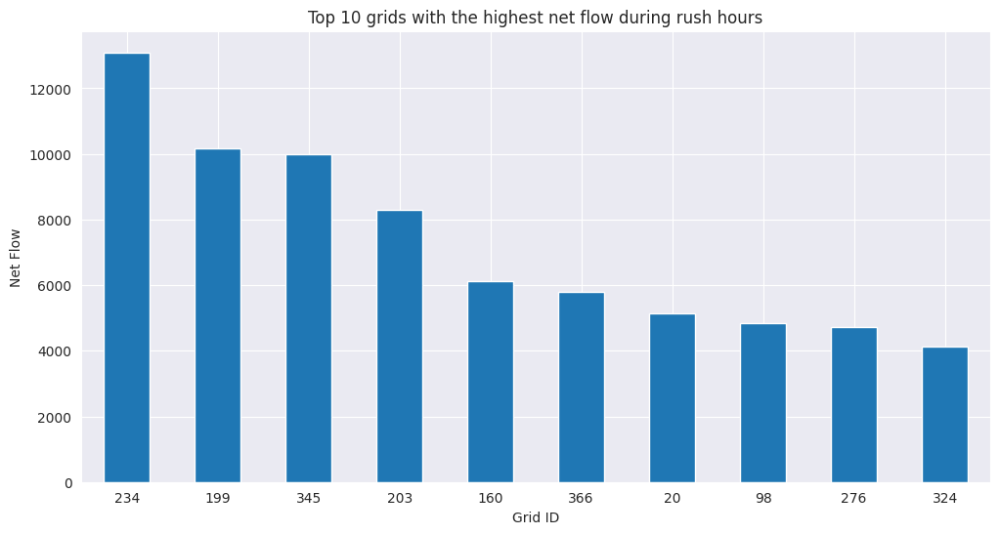

In [34]:
df = data2.copy()
# Convert the Datetime column to datetime type
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Filter the data for rush hours
rush_hour_data = df[(df['Datetime'].dt.hour >= 7) & (df['Datetime'].dt.hour < 10) | (df['Datetime'].dt.hour >= 17) & (df['Datetime'].dt.hour < 20)]
# Group the rush hour data by Grid_ID
grouped_data = rush_hour_data.groupby('Grid_ID')

# Calculate the total entries and exits for each grid
total_entries = grouped_data['C5'].sum()
total_exits = grouped_data['C6'].sum()

# Calculate the net flow (difference between entries and exits) for each grid
net_flow = total_entries - total_exits

# Find the top grids with the highest net flow
top_grids = net_flow.nlargest(10)

# Plot the top grids with the highest net flow
plt.figure(figsize=(12,6))
top_grids.plot(kind='bar')

plt.xlabel('Grid ID')
plt.ylabel('Net Flow')


# Rotate the x-labels to make them horizontal
plt.xticks(rotation=0)

plt.title('Top 10 grids with the highest net flow during rush hours')
plt.show()


In [35]:
main_road = data.sort_values(by = ["Eixo", "Datetime"], ascending=True)
main_road["Datetime"] = pd.to_datetime(main_road["Datetime"] )
road_df_rush_hour = main_road[main_road['Datetime'].dt.weekday.isin([0,1,2,3,4]) & 
        ((main_road['Datetime'].dt.hour >= 7) & (main_road['Datetime'].dt.hour < 10) |
         (main_road['Datetime'].dt.hour >= 17) & (main_road['Datetime'].dt.hour < 20))]

road_df = main_road[main_road['Datetime'].dt.weekday.isin([0,1,2,3,4])]
road_df.set_index('Datetime', inplace=True)
df_resampled = road_df.groupby('Eixo').resample('15T').mean()
road_df_rush_hour.set_index('Datetime', inplace=True)
df_resampled_rush = road_df_rush_hour.groupby('Eixo').resample('15T').mean()

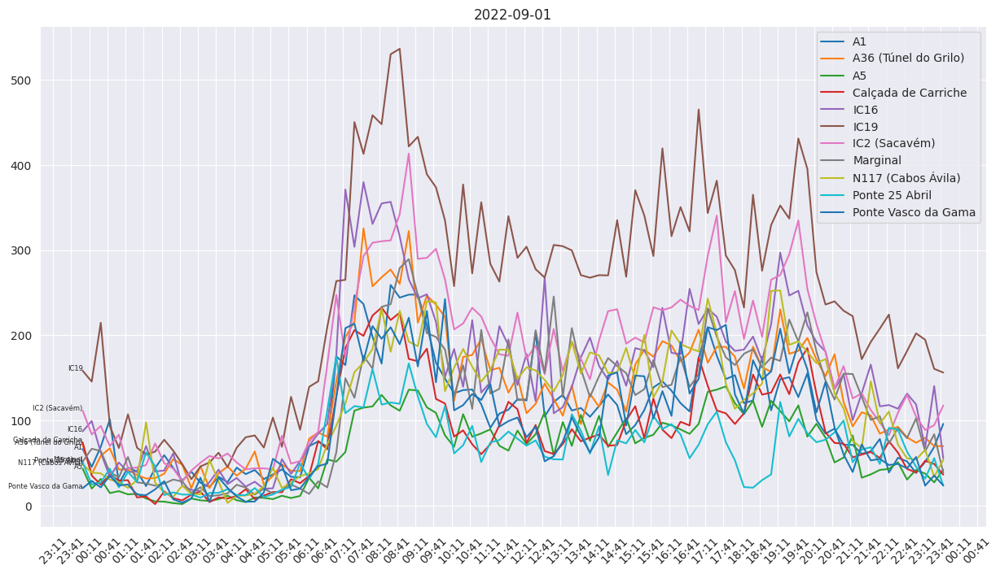

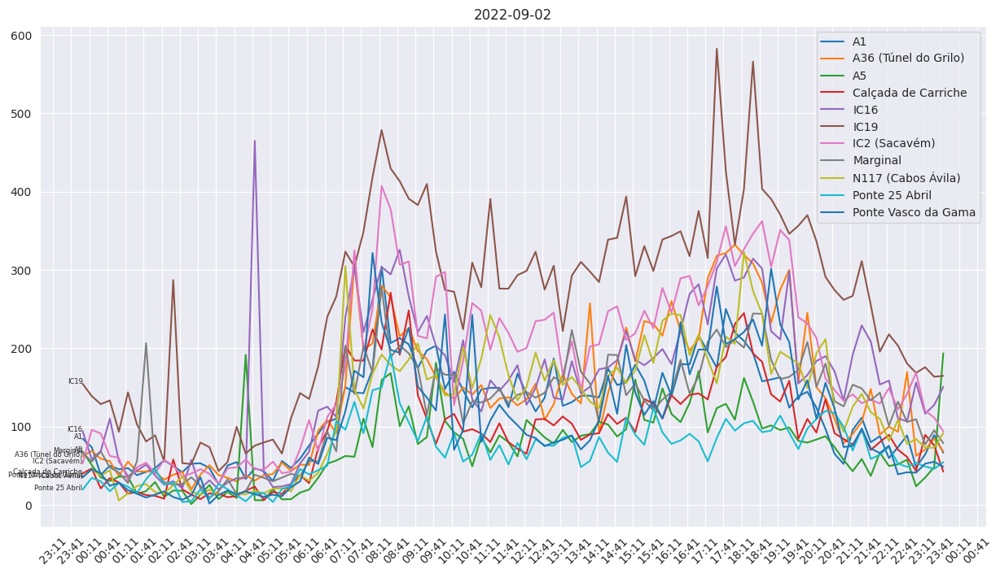

In [36]:
doi = ['2022-09-01', '2022-09-02']


for date_of_interest in doi:
  fig, ax = plt.subplots(figsize= (15, 8))
  for city in road_df['Eixo'].unique():
      city_data = df_resampled.loc[city]['C12'].loc[date_of_interest]
      ax.plot(city_data, label=city)
      ax.text(city_data.index[0], city_data.iloc[0], city, ha='right', fontsize=6)

  ax.xaxis.set_major_locator(MinuteLocator(interval=30))
  ax.xaxis.set_major_formatter(DateFormatter('%H:%M'))

  ax.tick_params(axis='x', labelrotation=45)

  ax.legend()
  plt.title(date_of_interest)
  plt.show()


In [37]:
def plot_week(start, end):
  

  fig, ax = plt.subplots(figsize=(20, 8))

  days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

  for day in days:
      # Filter data for the desired day, city "RIO", and the specified week
      day_data = road_df[(road_df.index >= start_date) & (road_df.index <= end_date) & (road_df['Eixo'] == 'IC19') & (road_df.index.day_name() == day)]
      # print(road_df.index.day_name() == day)

      # Resample the data to 5 minute intervals and calculate the average of C12 for each time interval
      resampled_data = day_data.resample('15T').mean()

      ax.plot(resampled_data['C12'], label=day)

  ax.xaxis.set_major_locator(MinuteLocator(interval=60))
  ax.xaxis.set_major_formatter(DateFormatter('%H:%M'))
    
  ax.set_xlabel('Time Span Selected') # Set custom x-axis label
  ax.set_xticklabels([]) # Remove default x-axis labels

  ax.tick_params(axis='x', labelrotation=45)

  ax.legend()
  plt.show()


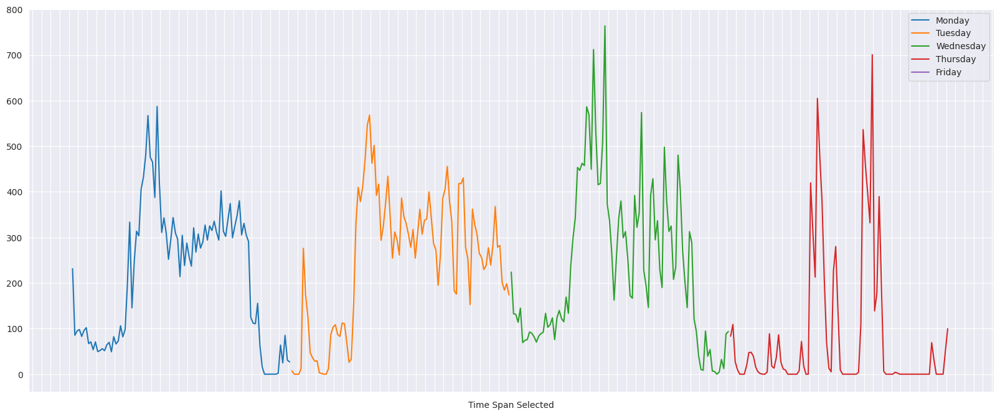

In [38]:
start_date = pd.to_datetime('2022-09-05').tz_localize(pytz.utc)
end_date = pd.to_datetime('2022-09-09').tz_localize(pytz.utc)

plot_week(start_date, end_date)

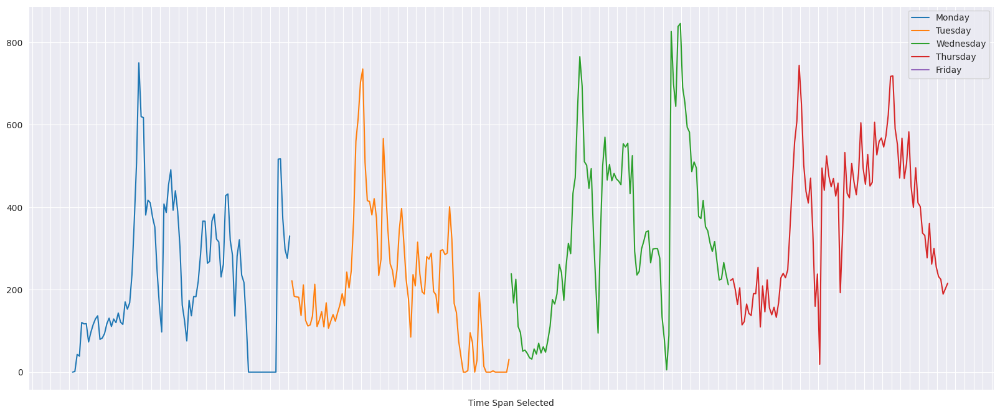

In [39]:
start_date = pd.to_datetime('2022-09-19').tz_localize(pytz.utc)
end_date = pd.to_datetime('2022-09-23').tz_localize(pytz.utc)

plot_week(start_date, end_date)